# 3rd Block. Reloading... Animation

## Extract data from  [here](https://www.athlinks.com/event/250405/results/Event/757258/Course/1285295/Results) and save to .csv file

In [1]:
import pathlib
import sys
sys.path.append(str(pathlib.Path.cwd().parent))

In [22]:
import json
from pprint import pprint

import requests
from tqdm import tqdm_notebook
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

import folium
from folium.plugins import TimestampedGeoJson
import numpy as np

from segments import create_segments, map_add_circles, map_add_trace
from distance import (START, SWIM, TRANSIT_ZONE_IN, TRANSIT_ZONE_OUT, BIKE,TOTAL_DISTANCE, RUN, 
                      FINISH, TURN_BACK_BIKE, TURN_BACK_RUN, create_marker)


%matplotlib inline
plt.figure(figsize=(12, 8))

In [23]:
EVENT = 757258
COURSE = 1285295
URL = "https://alaska.athlinks.com/Events/Race/Result/Api/Event/{EVENT}/Course/{COURSE}/Bib/{ATHLET_NUM}"
DATAPATH = pathlib.Path.cwd().parent.joinpath('data')
ICONS_PATH = pathlib.Path.cwd().parent.joinpath('icons')

In [5]:
BIBS = list(range(1, 137)) + [30247, 31292, 31403, 31081, 30323, 30194, 30413, 30387]

In [6]:
r = requests.get(URL.format(EVENT=EVENT, COURSE=COURSE, ATHLET_NUM=71))

In [7]:
data = r.json()

In [6]:
data['result']

{'courses': [{'affiliateCourseId': '107790',
   'affiliateEventId': '42969',
   'courseId': 1290570,
   'courseName': 'Sprint',
   'coursePattern': '3:750.00;0:0.00;4:20000.00;0:0.00;1:5000.00',
   'coursePatternCategory': '3:750.00:6;0:0.00:0;4:12.43:1;0:0.00:0;1:3.11:1',
   'coursePatternDescription': '750M Swim, 0 Transition, 12.4Mi Bike/Cycle, 0 Transition, 3.1Mi Run',
   'distLabel': 'Meters',
   'distUnit': 25750.0,
   'divisionId': None,
   'divisionName': 'Overall',
   'eventCourseId': 1285295,
   'isCtLive': True,
   'isPublished': False,
   'legCount': 0,
   'legs': [],
   'raceCategory': 'TriathlonMultisport',
   'results': [{'affiliateCourseId': '107790',
     'affiliateEventId': '42969',
     'age': 0,
     'ageRank': 13,
     'beginChipTime': 0,
     'bib': '71',
     'brackets': [{'bracketName': 'Overall',
       'bracketPublishResults': 1,
       'bracketRankType': 'GUN',
       'bracketTag': 'ALL',
       'bracketType': 'OPEN',
       'id': 1170065,
       'pace': None

In [7]:
for leg in r.json()['result']['courses'][0]['results'][0]['legs']:
    pprint(leg)

{'legId': 0,
 'legName': None,
 'legNumber': 1,
 'paceString': 'null',
 'paceUnit': None,
 'rankA': 13,
 'rankATotal': None,
 'rankG': 66,
 'rankGTotal': None,
 'rankO': 75,
 'rankOTotal': None,
 'speed': None,
 'ticks': None,
 'ticksString': '00:27:47'}
{'legId': 0,
 'legName': None,
 'legNumber': 2,
 'paceString': '00:03:21 min/100m',
 'paceUnit': None,
 'rankA': 13,
 'rankATotal': None,
 'rankG': 67,
 'rankGTotal': None,
 'rankO': 76,
 'rankOTotal': None,
 'speed': None,
 'ticks': None,
 'ticksString': '00:25:05'}
{'legId': 0,
 'legName': None,
 'legNumber': 3,
 'paceString': 'null',
 'paceUnit': None,
 'rankA': 13,
 'rankATotal': None,
 'rankG': 63,
 'rankGTotal': None,
 'rankO': 72,
 'rankOTotal': None,
 'speed': None,
 'ticks': None,
 'ticksString': '01:19:19'}
{'legId': 0,
 'legName': None,
 'legNumber': 4,
 'paceString': '15.51 km/hr',
 'paceUnit': None,
 'rankA': 13,
 'rankATotal': None,
 'rankG': 63,
 'rankGTotal': None,
 'rankO': 72,
 'rankOTotal': None,
 'speed': None,
 'ti

In [13]:
def extract_data():
    data = []
    for athlet_num in tqdm_notebook(BIBS):
        d = {}
        r = requests.get(URL.format(EVENT=EVENT, COURSE=COURSE, ATHLET_NUM=athlet_num))
        try:
            d['bib'] = r.json()['result']['courses'][0]['results'][0]['bib']
            d['name'] = r.json()['result']['courses'][0]['results'][0]['firstName']
            d['surname'] = r.json()['result']['courses'][0]['results'][0]['lastName']
            d['gender'] = r.json()['result']['courses'][0]['results'][0]['gender']
            d['brackets'] = '; '.join(bracket.get('bracketTag', '') for bracket in r.json()['result']['courses'][0]['results'][0]['brackets'])
            d['total_time'] = pd.Timedelta(r.json()['result']['courses'][0]['results'][0]['ivTimeWithPenalty'])
            d['t_swim'], d['t_tranzit_1'], d['t_bike'], d['t_tranzit_2'], d['t_run'], *_ = sorted([pd.Timedelta(leg['ticksString']) for leg in r.json()['result']['courses'][0]['results'][0]['legs']])
        except Exception as error:
            print('Error for #%s, %s' % (athlet_num, error))
        else:
            data.append(d)
    return pd.DataFrame(data)

In [9]:
df = extract_data()
df.head()

HBox(children=(IntProgress(value=0, max=144), HTML(value='')))

/home/sasha253c/.local/lib/python3.5/site-packages/tqdm/_monitor.py:89: TqdmSynchronisationWarning: Set changed size during iteration (see https://github.com/tqdm/tqdm/issues/481)
  TqdmSynchronisationWarning)


Error #18, list index out of range
Error #20, list index out of range
Error #27, list index out of range
Error #35, list index out of range
Error #37, list index out of range
Error #41, list index out of range
Error #42, list index out of range
Error #45, list index out of range
Error #47, not enough values to unpack (expected at least 5, got 2)
Error #57, list index out of range
Error #63, list index out of range
Error #66, list index out of range
Error #67, list index out of range
Error #68, list index out of range
Error #72, list index out of range
Error #73, list index out of range
Error #78, list index out of range
Error #79, list index out of range
Error #85, list index out of range
Error #86, list index out of range
Error #92, list index out of range
Error #93, list index out of range
Error #96, list index out of range
Error #99, list index out of range
Error #100, list index out of range
Error #101, list index out of range
Error #102, list index out of range
Error #103, list in

,bib,brackets,gender,name,surname,t_bike,t_run,t_swim,t_tranzit_1,t_tranzit_2,total_time
0,1,ALL; M; M3039,M,Олександр,Кудрик,00:52:22,01:17:42,00:16:20,00:17:44,00:53:38,01:17:42
1,2,ALL; M; M1829,M,Денис,Шиков,01:03:16,01:39:40,00:18:58,00:21:21,01:04:30,01:39:40
2,3,ALL; M; M3039,M,Сергій,Муравинець,00:53:05,01:19:14,00:13:05,00:14:57,00:54:24,01:19:14
3,4,ALL; M; M3039,M,Максим,П'ятенко,01:03:03,01:34:11,00:15:12,00:18:05,01:04:05,01:34:11
4,5,ALL; M; M4049,M,Сергій,Поліщук,01:05:38,01:36:31,00:22:13,00:24:16,01:07:51,01:36:31


In [14]:
df.shape

(83, 11)

In [11]:
# df['total_time'] = df['total_time'].apply(lambda x: pd.Timedelta(x))

In [19]:
df.to_csv(DATAPATH.joinpath('data.csv'))

## Data Analis

In [8]:
sns.set(rc={'figure.figsize':(8, 6)})
LEG_COLUMNS = ('t_swim', 't_tranzit_1', 't_bike', 't_tranzit_2', 't_run')
LEG_COLUMNS_SEC = ('t_swim_sec', 't_tranzit_1_sec', 't_bike_sec', 't_tranzit_2_sec', 't_run_sec')

In [9]:
df = pd.read_csv(DATAPATH.joinpath('data.csv'))
df.drop(columns='Unnamed: 0', inplace=True)
for time_column in LEG_COLUMNS + ('total_time', ):
    df[time_column] = pd.to_timedelta(df[time_column])

In [10]:
# convert timedelta to seconds
for i, j in zip(LEG_COLUMNS_SEC, LEG_COLUMNS):
    df[i] = df[j].map(lambda x: x.seconds)

In [11]:
df.head()

,bib,brackets,gender,name,surname,t_bike,t_run,t_swim,t_tranzit_1,t_tranzit_2,total_time,t_swim_sec,t_tranzit_1_sec,t_bike_sec,t_tranzit_2_sec,t_run_sec
0,1,ALL; M; M3039,M,Олександр,Кудрик,00:52:22,01:17:42,00:16:20,00:17:44,00:53:38,01:17:42,980,1064,3142,3218,4662
1,2,ALL; M; M1829,M,Денис,Шиков,01:03:16,01:39:40,00:18:58,00:21:21,01:04:30,01:39:40,1138,1281,3796,3870,5980
2,3,ALL; M; M3039,M,Сергій,Муравинець,00:53:05,01:19:14,00:13:05,00:14:57,00:54:24,01:19:14,785,897,3185,3264,4754
3,4,ALL; M; M3039,M,Максим,П'ятенко,01:03:03,01:34:11,00:15:12,00:18:05,01:04:05,01:34:11,912,1085,3783,3845,5651
4,5,ALL; M; M4049,M,Сергій,Поліщук,01:05:38,01:36:31,00:22:13,00:24:16,01:07:51,01:36:31,1333,1456,3938,4071,5791


In [12]:
df.shape

(83, 16)

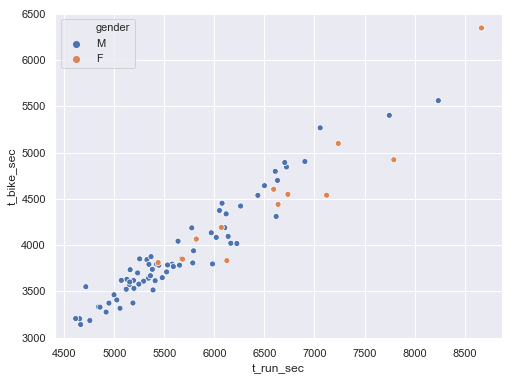

In [13]:
sns.scatterplot(x='t_run_sec', y='t_bike_sec', data=df, hue=df['gender'])

## Map animation

In [25]:
NUM = 20
START_TIMESTAMP = 1534579200000  # 18.08.2018 11:00:00

In [26]:
expended_swim_trace = create_segments([START,] + SWIM + [START, TRANSIT_ZONE_IN], 200)
expended_transit_trace = create_segments((TRANSIT_ZONE_IN, TRANSIT_ZONE_OUT), 10)
expended_bike_trace = create_segments([TRANSIT_ZONE_OUT, ] + BIKE + [TRANSIT_ZONE_IN, ], 1000)
expended_run_trace = create_segments([TRANSIT_ZONE_OUT, ] + RUN + [FINISH, ], 300)

In [27]:
def create_geo_json_dict(item):
    d = {
        'type': 'Feature',
        'geometry': {
          'type': 'LineString',
          'coordinates': [],
          },
        'properties': {
          'times': [],
            'popup': 
            '{name} {surname} ({gender}); Группа: {brackets}'.format(**item)
          }
        }
    
    for start, end, trace in zip((0,) + LEG_COLUMNS_SEC,
                                 LEG_COLUMNS_SEC,
                                 (expended_swim_trace, expended_transit_trace, expended_bike_trace, expended_transit_trace, expended_run_trace)):
        time_laps = np.linspace(item[start], item[end], num=len(trace))*1000 + START_TIMESTAMP
        d['geometry']['coordinates'].extend([[p.longitude, p.latitude] for p in trace])
        d['properties']['times'].extend(time_laps.tolist())
    return d

In [31]:
df_m50 = df[df['brackets'].str.contains("M50")]

In [33]:
folium_map = folium.Map(location=(START.latitude, START.longitude),
                        zoom_start=13,
                        tiles="openstreetmap")
    
# create Icons
start_image_path = ICONS_PATH.joinpath("start.png")
transit_image_path = ICONS_PATH.joinpath("transit.png")
finish_image_path = ICONS_PATH.joinpath("finish.png")
turn_back_bike_image_path = ICONS_PATH.joinpath("turn_back_bike.png")
turn_back_run_image_path = ICONS_PATH.joinpath("turn_back_run.png")

for point, path_icon, popup in ((START, start_image_path, 'Start'),
                                (TRANSIT_ZONE_IN, transit_image_path, 'TRANSIT_ZONE_IN'),
                                (TRANSIT_ZONE_OUT, transit_image_path, 'TRANSIT_ZONE_OUT'),
                                (TURN_BACK_BIKE, turn_back_bike_image_path, 'TURN_BACK_BIKE'),
                                (TURN_BACK_RUN, turn_back_run_image_path, 'TURN_BACK_RUN'),
                                (FINISH, finish_image_path, 'FINISH'),
                               ):
    folium_map = create_marker(folium_map, point=point, image_path=path_icon, popup=popup)
    

folium_map = map_add_circles(folium_map, SWIM, radius=8, color='#ff0000')
folium_map = map_add_trace(folium_map, TOTAL_DISTANCE)

data = {
    'type': 'FeatureCollection',
    'features': []
    }

data['features'] = [create_geo_json_dict(item) for _, item in df.iterrows()]
    
    
tgs = TimestampedGeoJson(data, period='PT1S')
folium_map = folium_map.add_child(tgs)
folium_map.save(str(pathlib.Path.cwd().parent.joinpath('map', 'competition.html')))

In [34]:
folium_map